# Ex 7.1 Visualizing a large Dataset
Below you will find a large(r) dataset with time series data of environmental sensors

Hint: Rooms with a '0' as second digit have a different orientation than rooms with a '1'

You might use you own dataset as well under the asumption:
* you have time series data
* you have at least three additional features that depend on time


## 0 Install required packages 
* for presentation mode in jupyter: Install Rise. After that, you can run a presentation directly from jupyter-notebook<br>
  In order to create slides you MUST run in jupyter-notebook mode. Jupyter-Lab is not (yet) supporting RISE. When in question look at the top line:<br>
  It should read something like *http://localhost:8888/tree/*
  
  Then:<br>
  * In the notebook menu go to  View -> Cell Toolbar -> Slideshow
  * This enables a dropdown menu in the very right corner of each cell of your notebook. <br>
    From the dropdown you can select the type of cell in your slideshow:<br>
    * Slide: A new topic/slide. This creates a new slide in your presentation following the previous slide to the right (when using the navigation buttons in the presentation).
    * Sub-Slide: This starts a new section within a topic. Sub-Slide cells are placed on a new slide underneath the previous slide.
    * Fragments: Additional information on a slide. Fragments appear on the same slide or sub-slide. This is the typical Powerpoint style animation.
    * Notes: Speaker notes. These appear in a separate browser window.
    * Skip: Cells will not appear in the presentation.
* For visualization and interactive diagrams install plotly<br> You will finde the documentation [here](https://plotly.com/python/)

In [1]:
#import sys

#install rise if it is not installed
#!conda install --yes --prefix {sys.prefix} -c conda-forge rise

#install plotly if it is not installed
#!conda install --yes --prefix {sys.prefix} plotly

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import plotly.express as px
import plotly.graph_objects as go

transformToParquet = False

## 1 Load the data into a dataframe and convert the date strings
### 1.1 Load the data as parquet or csv

The solution shows also the performance benefits that can be gained by transforming data from .csv to compressed parquet in term of storage efficiency and reading speed.

In [3]:
if transformToParquet == True:
    %time df = pd.read_csv(r"./data/07092021bimsim_room.csv", sep=",")
    %time df["datetime"] = pd.to_datetime(df["datetime"],format='%Y-%m-%d %H:%M:%S.%f') 
    %time df.to_parquet(r"./data/07092021bimsim_room.parquet", compression="gzip")


In [4]:
%time df2 = pd.read_parquet(r"../Material/07092021bimsim_room.parquet")

CPU times: total: 1.02 s
Wall time: 700 ms


In [5]:
import os

s_csv = os.path.getsize(r"./data/07092021bimsim_room.csv")/(1024*1024)
s_parquet = os.path.getsize(r"./data/07092021bimsim_room.parquet")/(1024*1024)
rate = s_csv/s_parquet

display("size(csv): "+ str(s_csv), "size(parquet): "+str(s_parquet), "compresseion rate: " + str(rate))

'size(csv): 173.40628051757812'

'size(parquet): 22.67706298828125'

'compresseion rate: 7.646769804678353'

In [6]:
df = df2

### 1.2 Convert Date and Time

In [7]:
if transformToParquet == False:
    %time df["datetime"] = pd.to_datetime(df["datetime"],format='%Y-%m-%d %H:%M:%S.%f') 

CPU times: total: 15.6 ms
Wall time: 20.8 ms


In [8]:
df.head(5)

,source,datetime,id,celsius,pressure,humidity,sensor,room
0,0013A20041A94BE7,2021-03-21 01:46:22,1.616288e+09,18.772852,969.5412,33.374760,0013A20041A94BE7,H203
1,0013A20041A94BE7,2021-03-21 01:51:24,1.616288e+09,18.772852,969.5412,33.369170,0013A20041A94BE7,H203
2,0013A20041A94BE7,2021-03-21 01:56:27,1.616288e+09,18.767773,969.4889,33.704514,0013A20041A94BE7,H203
3,0013A20041A94BE7,2021-03-21 02:01:29,1.616288e+09,18.747656,969.5412,33.441830,0013A20041A94BE7,H203
4,0013A20041A94BE7,2021-03-21 02:06:31,1.616289e+09,18.742579,969.4889,33.508900,0013A20041A94BE7,H203


## 2 Remove duplicate data to reduce total memory consumption
Domain knowledge:
* the columns "source" and "sensor" are identical
* "sensor" and "room" have a 1:1 mapping
* "id" contains the datetime as float
* some sensors might deliver negative temperatures <100°C. This is an errorneous measurement

### 2.1 Duplicate data removal

In [9]:
df = df.drop(["source", "sensor", "id"], axis=1) 

### 2.2 Data Preparation

**Remove errorneous data**

In [10]:
df[df["room"].isnull()].count()

datetime    5676
celsius     5676
pressure    5676
humidity    5676
room           0
dtype: int64

In [11]:
df["room"].unique()

array(['H203', 'H110', 'H207', 'H218', 'H212', 'H106', 'H205',
       'H216_desk_at_window', 'H217', 'across_from_H207_on_railing',
       'H113', 'H215', 'H208', 'H206', 'H109', 'H209', 'H116', 'H211',
       None, 'H213', 'H210', 'H216', 'H111', 'H214', 'H220', 'H108'],
      dtype=object)

* **drop rows that have no room identifier**

In [12]:
df = df[df["room"].isna() == False]

In [13]:
df["room"].value_counts()

room
H215                           85496
H216                           80166
H203                           74395
H214                           72267
H207                           71778
H213                           71342
H217                           70683
H206                           70563
H113                           70062
H211                           68688
H218                           67970
H110                           66877
H212                           66680
H210                           65990
H208                           65828
H205                           65074
H106                           64918
across_from_H207_on_railing    62510
H209                           62292
H220                           61921
H111                           59988
H109                           58661
H108                           56901
H216_desk_at_window            51771
H116                            6832
Name: count, dtype: int64

* **Ignore rows where the temp reading is errorneous**

In [14]:
# ignore erroneous rows
df = df[df["celsius"] > 0]
df.describe()

,datetime,celsius,pressure,humidity
count,1618966,1.618966e+06,1.618966e+06,1.618966e+06
mean,2021-03-31 01:19:50.074875904,2.134781e+01,9.570233e+02,3.409096e+01
min,2020-09-25 12:53:29,1.123594e+01,8.726273e+02,1.362422e+01
25%,2021-01-22 04:29:22.750000128,1.950312e+01,9.497299e+02,2.924830e+01
50%,2021-03-22 21:41:25,2.122012e+01,9.572859e+02,3.316805e+01
75%,2021-06-01 08:07:11,2.305332e+01,9.644658e+02,3.853541e+01
max,2021-09-07 01:59:59,3.888359e+01,1.034922e+03,9.705182e+01
std,NaN,2.934655e+00,1.042585e+01,6.315351e+00


## 3 Visualize the data 

Perform Visualizations for different types of diagrams using either

1. matpolotlib/seaborn
2. plotly


**Important Hint**: Check the total volume of data points first. If needed create a digestible subset. Keep in mind, that visualizing large volumes of data points (i.e. > 10e5) can significantly slow down the notebook. Too many datapoints might even crash the browser, due to limited RAM availability for a browser tab in all common browsers.

## 3.1 Create different table aggregations to check for "Simposons Paradox"
Hints: 
* Find an appropriate aggregation of which you think, it could generate a paradox. E.g. compare an aggregation of multiple rooms with a single rooom.
* Rooms with a '0' in the middle are on one side of the building, with a '1' on another.
* There are also errorneous values in the data, that you might want to remove first.
* Consider different time spans. During the winter period, many rooms a heated. During summer, the room temperatures are more influenced by the outside environmental conditions

In [15]:
df[["celsius", "pressure", "humidity", "room"]].describe()

,celsius,pressure,humidity
count,1.618966e+06,1.618966e+06,1.618966e+06
mean,2.134781e+01,9.570233e+02,3.409096e+01
std,2.934655e+00,1.042585e+01,6.315351e+00
min,1.123594e+01,8.726273e+02,1.362422e+01
25%,1.950312e+01,9.497299e+02,2.924830e+01
50%,2.122012e+01,9.572859e+02,3.316805e+01
75%,2.305332e+01,9.644658e+02,3.853541e+01
max,3.888359e+01,1.034922e+03,9.705182e+01


### 3.1.1 Grouping by Room id
We compare statistics on top level with statistics on group level 

In [16]:
df[["celsius", "pressure", "humidity", "room"]].groupby("room").mean()

,celsius,pressure,humidity
room,,,
H106,21.701848,956.938777,30.494777
H108,18.231016,963.088500,35.385904
H109,21.537157,958.237226,30.931523
H110,19.888868,958.523370,35.470957
H111,20.041353,959.197715,33.743818
H113,20.741527,957.829181,36.169041
H116,20.376886,952.593052,34.223840
H203,20.862372,957.633477,36.742165
H205,20.111844,959.573019,35.611134


### 3.1.2 Alternate grouping
We select rooms with 0 in the middle into one group and rooms with 1 in the middle into the other group

In [17]:
southeast_rooms = df[(df["room"].str[2:3] == "1")]
southwest_rooms = df[(df["room"].str[2:3] == "0")]

In [18]:
southeast_rooms[["celsius", "pressure", "humidity", "room"]].describe()

,celsius,pressure,humidity
count,904447.000000,904447.000000,904447.000000
mean,21.297878,956.905951,34.807005
std,2.870020,10.434281,6.269684
min,11.733398,872.627260,14.087907
25%,19.196875,949.353600,30.002739
50%,21.219921,957.125730,33.961590
75%,23.107616,964.329160,39.329210
max,37.236717,1034.922200,65.663960


In [19]:
southwest_rooms[["celsius", "pressure", "humidity", "room"]].describe()

,celsius,pressure,humidity
count,590169.000000,590169.000000,590169.000000
mean,21.107965,957.487179,33.699558
std,3.013252,10.435078,6.292945
min,11.235937,918.119500,15.127609
25%,19.513280,950.459840,28.781530
50%,21.058008,957.710750,32.866093
75%,22.661327,964.954200,38.223484
max,36.080860,988.765300,97.051820


### Intermediate Conclusion:
Just checking the fundamental statistics, we cannot see an indication of Simpsons paradox in the aggregation vs. the "0" and "1" groups

Conjecture: We have data over a very long timespan. The change of seasons and the different behaviour of people using the rooms might have an effect. Perhaps differences between single room or a subset of rooms and the aggregations are visible, if we consider shorter timespans. 

### 3.1.3 Look at a shorter timespan

We select a single month period during summertime. The idea is, that during that period no forced heating of the rooms happens. Thus, we might see an effect in the different exposure of the rooms to the sunlight according to the geographical orientation.

In [20]:
# create a time filtered data frame
# limits are used pythonic, i.e. start is included, end is excluded [start, end[
def getTimeFilteredDataFrame(df, begin, end):
    return df[(df["datetime"]>= begin) & (df["datetime"] <end)].copy()

In [21]:
begin = pd.to_datetime("2021-06-01 00:00:00")
end = pd.to_datetime("2021-07-01 00:00:00")

In [22]:
southeast_rooms = getTimeFilteredDataFrame(southeast_rooms, begin, end)
southwest_rooms = getTimeFilteredDataFrame(southwest_rooms, begin, end)
all_rooms = getTimeFilteredDataFrame(df, begin, end)

In [23]:
display(southeast_rooms.datetime.min(), 
southeast_rooms.datetime.max())

Timestamp('2021-06-01 00:00:03')

Timestamp('2021-06-30 23:59:41')

In [24]:
display(southeast_rooms.shape, southwest_rooms.shape, all_rooms.shape)
display(southeast_rooms[["celsius", "pressure", "humidity", "room"]].describe(), southwest_rooms[["celsius", "pressure", "humidity", "room"]].describe(), all_rooms[["celsius", "pressure", "humidity", "room"]].describe())

(32071, 5)

(40661, 5)

(85662, 5)

,celsius,pressure,humidity
count,32071.000000,32071.000000,32071.000000
mean,26.125381,951.079349,38.083973
std,1.836525,5.749967,3.625018
min,19.727540,935.374600,26.586830
25%,24.918750,946.946810,35.849937
50%,25.967188,950.851900,37.839943
75%,27.274902,955.400850,40.510718
max,31.603907,967.024840,59.148014


,celsius,pressure,humidity
count,40661.000000,40661.000000,40661.000000
mean,25.866452,952.660605,37.502786
std,2.407703,7.485587,3.675326
min,19.290821,928.185240,22.792145
25%,24.231054,947.344600,35.377950
50%,25.738087,953.740300,37.667336
75%,27.219921,958.397640,39.726376
max,36.080860,968.036500,57.050050


,celsius,pressure,humidity
count,85662.000000,85662.000000,85662.000000
mean,26.246004,951.865394,37.352354
std,2.267758,6.828636,3.896457
min,19.290821,928.185240,13.624221
25%,24.787891,947.083200,35.243751
50%,26.075390,952.452200,37.456980
75%,27.515186,956.915650,39.674730
max,38.883595,968.036500,59.148014


### Intermediate Conclusion 2:
When looking at a shorter timespan (during summer, where no forced heating is happening), we can see a slight indication of different bahaviour in the two groups (esp. T max) when looking at the temperature. To investigate further, we look at plots over time

## 3.1 Create a graph over time
Use the line or scatter graphs to check for simpsons paradox.
What is the difference in the perception of the data when using line graphs compared to scatter graphs? Think about missing data!

### 3.1.1 Plotting data as is

Timestamp('2021-06-01 00:00:36')

<Figure size 1600x1000 with 0 Axes>

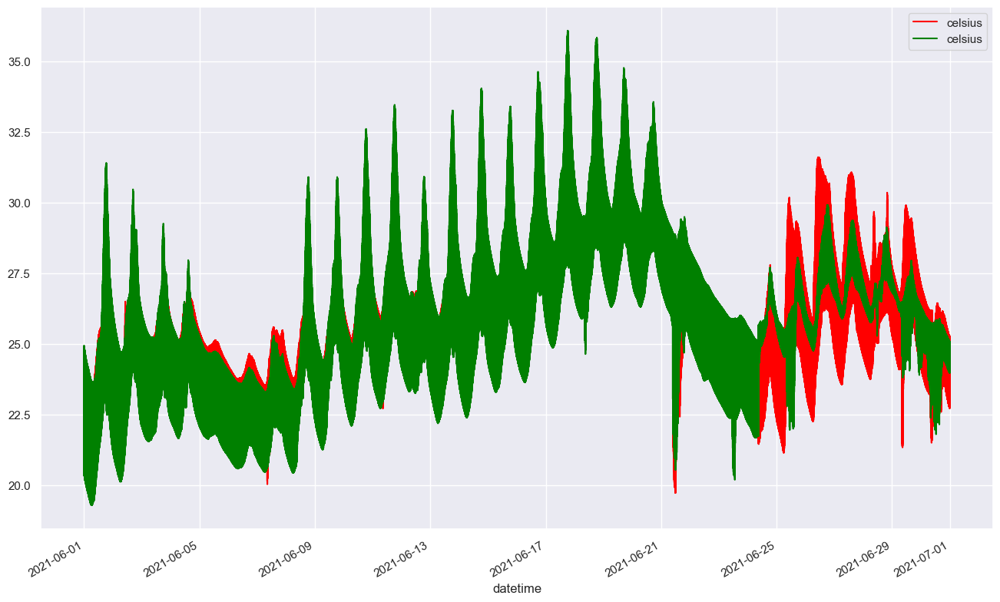

In [25]:
# your code here
plt.figure(figsize=(16, 10))
ax = southeast_rooms.plot(x="datetime", y="celsius", color = "red", figsize=(16, 10))
southwest_rooms.plot(x="datetime", y="celsius", color = "green", ax=ax)
#all_rooms.plot(x="datetime", y="celsius", color = "green", ax=ax)

southwest_rooms["datetime"].min()

#### Observation
The above diagram is plotting all the data for all rooms. But we are interested in the groupwise temperature at a specific time. So we group using the datetime column. But this can only work if the timestamps per room are the same

### 3.1.2 Plotting time aligned data
Groupby operation on datetime is not always finding matches in time, as the clocks of the sensors generating the data are not synchronized. Note that this is commonplace for many datasets that contain data coming from differnt sensor measuring entities. An alternative could be to round the timestamp to the nearest quarter hour and then aggregate on time.

In order to be able to group by time we have to align the timestamps of the sensors. We know from the application domain, that sensor sampling happens every 5 minutes (can be seen in the data as well). To aggregate further - temperature is changing slowly - we round to the nearest quarter hour

In [26]:
## Alternative: Round the timestamps to align between rooms
southwest_rooms["time_r"] = southwest_rooms["datetime"].dt.round(freq="15min")
southeast_rooms["time_r"] = southeast_rooms["datetime"].dt.round(freq="15min")
all_rooms["time_r"] = all_rooms["datetime"].dt.round(freq="15min")

Now we can group the data together. The next two lines are a tweak to keep the room in the grouped object. Otherwise the grouping will fail on the rooms when using min, mean, max or similar grouping operations. We build groups by aligned time and rooms (see Note 1). Then we build an aggregated object using max, min, mean, ... and visualize the result. The resulting graph gets the aggregated view of all objects added.

Note 1: If we would not group on rooms, the room column would generate an error when creating the aggregated views, as there is no mean room. Hence we put the into the group index, build the aggregation and reindex, so that the room is in the aggregated view again.

In [27]:
sw_grouped = southwest_rooms.groupby(["time_r", "room"])[["celsius", "pressure", "humidity"]]
se_grouped = southeast_rooms.groupby(["time_r", "room"])[["celsius", "pressure", "humidity"]]
all_grouped = all_rooms.groupby(["time_r", "room"])[["celsius", "pressure", "humidity"]]
all_grouped_noroom = all_rooms.groupby(["time_r"])[["celsius", "pressure", "humidity"]]

In [28]:
swg = sw_grouped.max().reset_index(level=1)
seg = se_grouped.max().reset_index(level=1)
allg = all_grouped.max().reset_index(level=1)
allg_nr = all_grouped_noroom.max()
allg_nr["room"] = "all"
allg_nr.reset_index()

,time_r,celsius,pressure,humidity,room
0,2021-06-01 00:00:00,26.505077,962.40894,37.330406,all
1,2021-06-01 00:15:00,26.463867,962.48785,37.549050,all
2,2021-06-01 00:30:00,26.335352,962.61930,37.729420,all
3,2021-06-01 00:45:00,26.191212,962.67194,37.795006,all
4,2021-06-01 01:00:00,26.073048,962.77710,37.948036,all
...,...,...,...,...,...
2876,2021-06-30 23:00:00,25.379100,955.05664,44.984627,all
2877,2021-06-30 23:15:00,25.349415,955.21375,45.180603,all
2878,2021-06-30 23:30:00,25.328907,955.24000,44.732643,all
2879,2021-06-30 23:45:00,25.298046,955.34470,45.130210,all


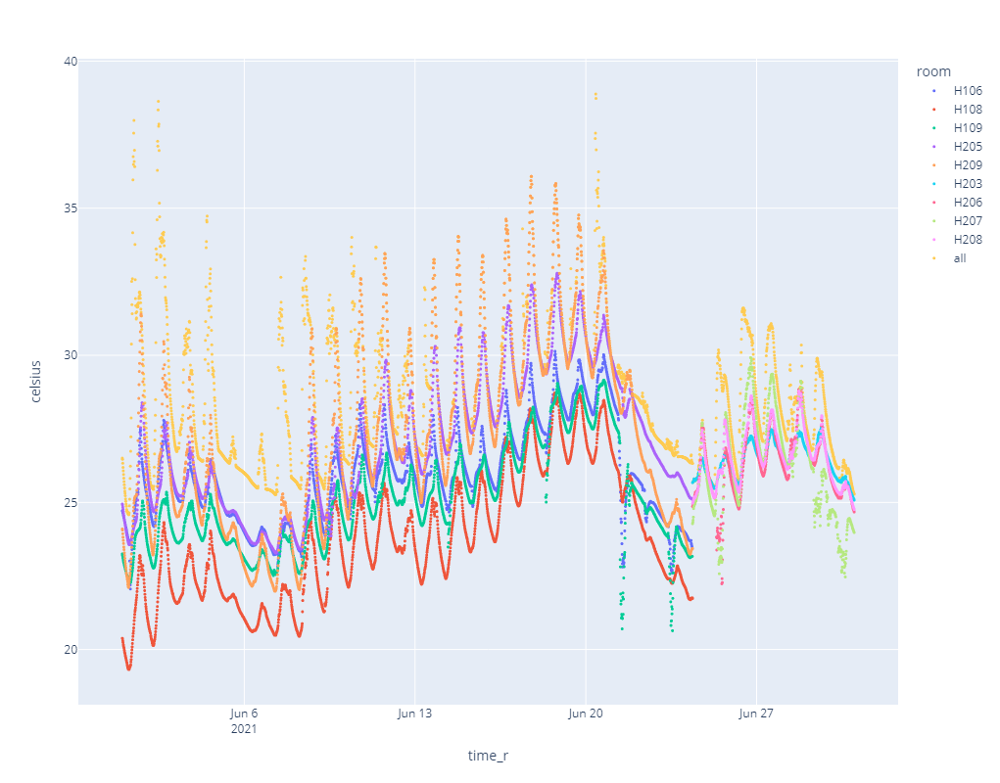

In [29]:
fig = px.scatter(swg, y="celsius", color="room",  width=1200, height = 800)
fig.add_trace(
    go.Scatter(
        x=allg_nr.reset_index()["time_r"],
        y=allg_nr.reset_index()["celsius"],
        mode="markers",
        name = "all"))
fig.update_traces(marker_size=3)    
fig.show()


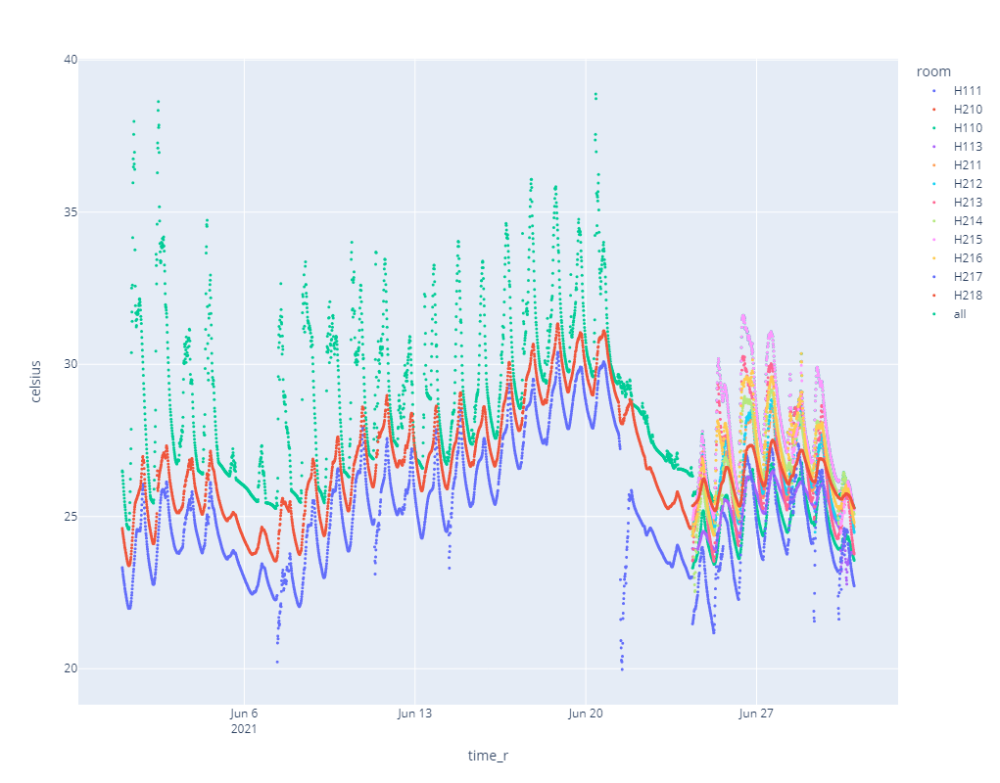

In [30]:
fig = px.scatter(seg, y="celsius", color="room",  width=1200, height = 800)
fig.add_trace(
    go.Scatter(
        x=allg_nr.reset_index()["time_r"],
        y=allg_nr.reset_index()["celsius"],
        mode="markers",
        name = "all"))
fig.update_traces(marker_size=3)
fig.show()

In [31]:
sw_grouped_noroom = southwest_rooms.groupby(["time_r"])[["celsius", "pressure", "humidity"]]
se_grouped_noroom = southeast_rooms.groupby(["time_r"])[["celsius", "pressure", "humidity"]]
all_grouped_noroom = all_rooms.groupby(["time_r"])[["celsius", "pressure", "humidity"]]

In [32]:
swg_nr = sw_grouped_noroom.max().reset_index()
seg_nr = se_grouped_noroom.max().reset_index()
allg_nr = all_grouped_noroom.max().reset_index()

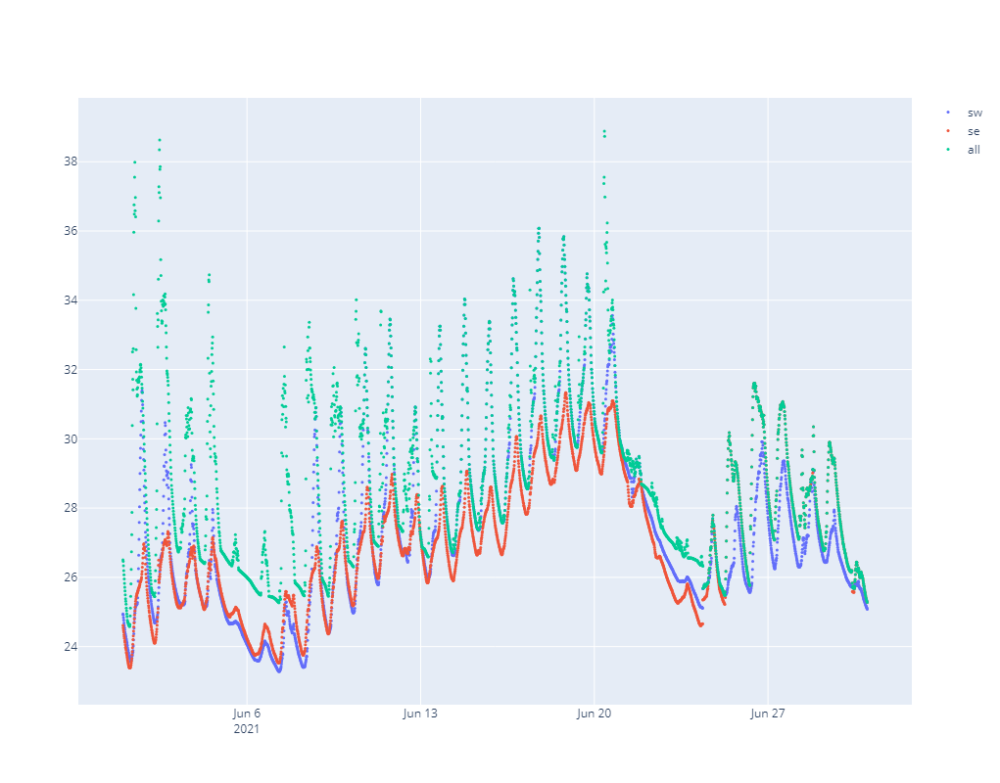

In [33]:
layout = go.Layout(
    autosize=False,
    width=1200,
    height=800,
)

fig = go.Figure(layout=layout)

#fig = px.scatter(swg_nr, x = "time_r", y="celsius", width=1200, height = 800)
fig.add_trace(
    go.Scatter(
        x=swg_nr["time_r"],
        y=swg_nr["celsius"],
        mode="markers",
        name = "sw"))

fig.add_trace(
    go.Scatter(
        x=seg_nr["time_r"],
        y=seg_nr["celsius"],
        mode="markers",
        name = "se"))
fig.add_trace(
    go.Scatter(
        x=allg_nr["time_r"],
        y=allg_nr["celsius"],
        mode="markers",
        name = "all"))
fig.update_traces(marker_size=3)
fig.show()

### Intermediate Conclusion 3:
The is a kind of simpsons paradox visible in the data, as there is a shift in the aggregation depending on the rooms positions

## 3.2 Create a 3D scatterplot for the environmental data


In [34]:
subdf = df[df["room"].isin(["H203", "H217"])]

In [35]:
subdf = subdf[subdf["datetime"]>"2021-09-06"]
subdf.head()

,datetime,celsius,pressure,humidity,room
36254,2021-09-06 00:03:04,27.300781,954.23600,43.013940,H203
36255,2021-09-06 00:08:08,27.290821,954.31450,42.991646,H203
36256,2021-09-06 00:13:11,27.280664,954.31450,42.997220,H203
36257,2021-09-06 00:18:15,27.270702,954.34064,43.164425,H203
36258,2021-09-06 00:23:18,27.260548,954.26215,43.052956,H203


In [36]:
subdf.shape

(605, 5)

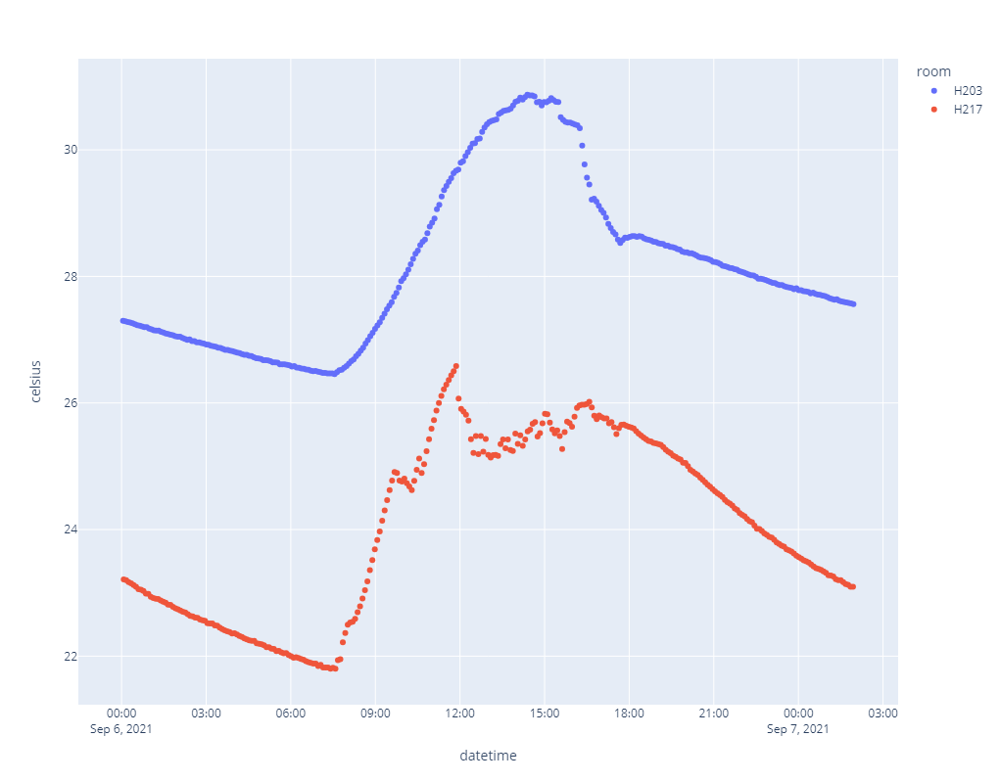

In [37]:
fig = px.scatter(subdf, x="datetime", y="celsius", color="room",  width=1200, height = 800)
fig.show()

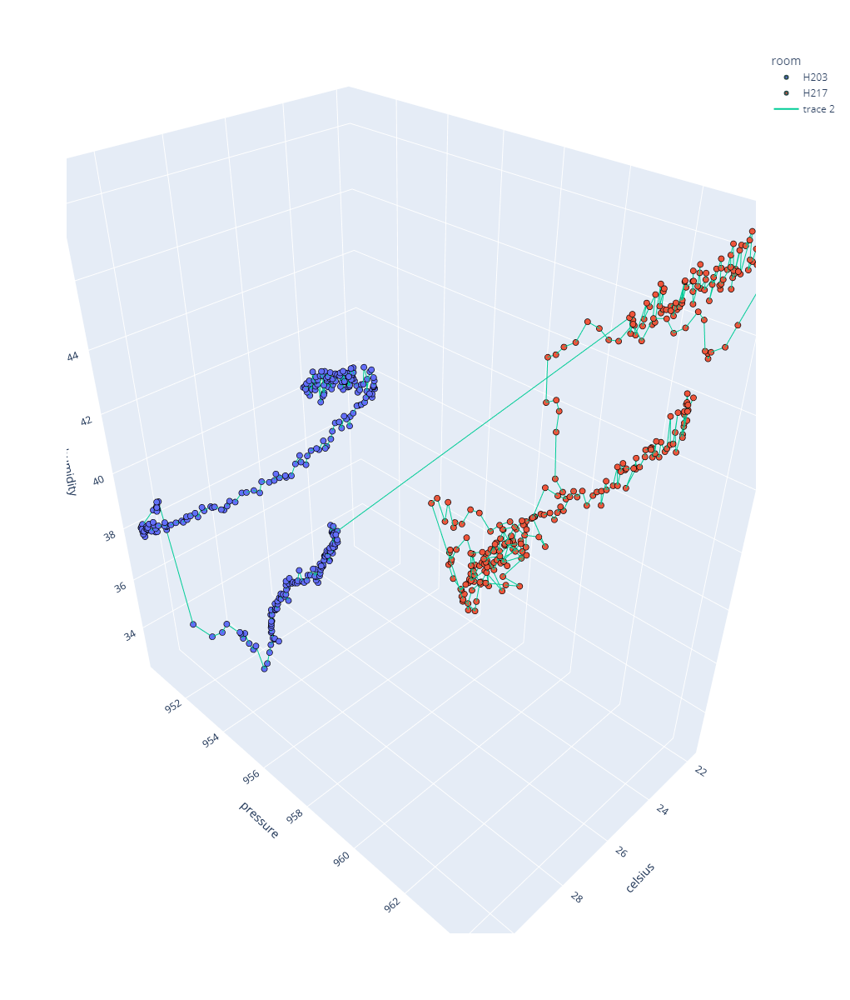

In [38]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter_3d(subdf, x='celsius', y='pressure', z='humidity', color='room', width=1200, height=1200)
fig.add_trace(go.Scatter3d(x=subdf["celsius"].to_numpy().flatten(), y=subdf["pressure"].to_numpy().flatten(), z=subdf["humidity"].to_numpy().flatten(), text=subdf["room"].to_list(),
                           mode="lines"))
#                           mode="lines+text"))
fig.update_traces(marker=dict(size=4, line=dict(width=2, color='DarkSlateGrey')), 
                  selector=dict(mode='markers'))

# If you want to sepcify the range of the axes:
#fig.update_layout(
#    scene = dict(
#        xaxis = dict(nticks=4, range=[0,40],),
#        yaxis = dict(nticks=4, range=[900,1100],),
#        zaxis = dict(nticks=4, range=[30,100],),),
#    margin=dict(r=20, l=10, b=10, t=10))
fig.show()

In [39]:
df[df["room"]=="H217"].count()

datetime    70586
celsius     70586
pressure    70586
humidity    70586
room        70586
dtype: int64

<Axes: xlabel='datetime', ylabel='celsius'>

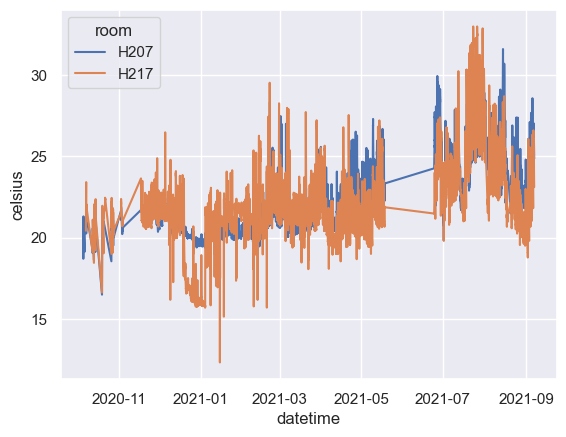

In [40]:
sns.lineplot(data=df[(df["room"].isin(["H217", "H207"]))], x="datetime", y="celsius", hue="room")

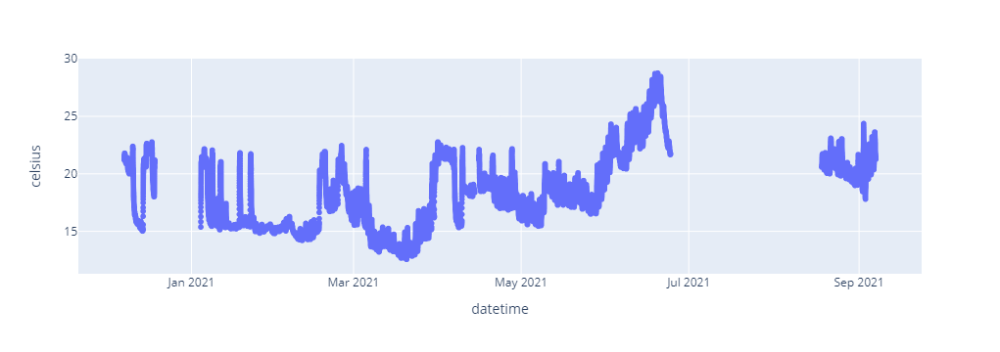

In [41]:
fig = px.scatter(df[df["room"] == "H108"], x="datetime", y="celsius")
fig.show()

In [42]:
subdf

,datetime,celsius,pressure,humidity,room
36254,2021-09-06 00:03:04,27.300781,954.23600,43.013940,H203
36255,2021-09-06 00:08:08,27.290821,954.31450,42.991646,H203
36256,2021-09-06 00:13:11,27.280664,954.31450,42.997220,H203
36257,2021-09-06 00:18:15,27.270702,954.34064,43.164425,H203
36258,2021-09-06 00:23:18,27.260548,954.26215,43.052956,H203
...,...,...,...,...,...
582339,2021-09-07 01:35:12,23.169336,963.41230,44.643044,H217
582340,2021-09-07 01:40:26,23.138477,963.38610,44.564644,H217
582341,2021-09-07 01:45:41,23.128320,963.35990,44.844640,H217
582342,2021-09-07 01:50:55,23.097462,963.43850,44.413437,H217
